### Описание проекта

Необхоимо подготовить исследование рынка общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут инвесторам «Shut Up and Take My Money» в выборе подходящего места для открытия заведения общественного питания.

**Заказчик:** инвесторы из фонда «Shut Up and Take My Money»

**Цели проекта:**

- исследовать зависимости в данных по таким признакам как: категория, сеть/не сеть, посадочные места, административным районам, среднему рейтингу
- найти ТОП-15 сетевых заведений и ТОП-15 улиц по количеству заведений
- отобразить заведения на карте
- исследовать улицы с 1 заведением
- исследовать зависимость среднего чека от удаления от центра города
- исследовать кофейни и сформулировать рекомендации для открытия нового заведения

### Описание данных

**Файл `moscow_places.csv`:**

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
    - и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

### Загрузка и изучение данных

In [1]:
import pandas as pd
import numpy as np
import json
import seaborn as sns
#pip install folium
import folium
import matplotlib.pyplot as plt
import plotly.express as px
import warnings; warnings.filterwarnings(action = 'ignore')
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
#pip install nltk
from nltk.metrics import edit_distance

In [2]:
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_rows', None)

In [3]:
df = pd.read_csv('moscow_places.csv') 

In [4]:
display(df.head(5))
df.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,nan,nan,0,nan
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",nan,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",nan,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,nan,170.00,0,nan
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,nan,1,148.00


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
name                 8406 non-null object
category             8406 non-null object
address              8406 non-null object
district             8406 non-null object
hours                7870 non-null object
lat                  8406 non-null float64
lng                  8406 non-null float64
rating               8406 non-null float64
price                3315 non-null object
avg_bill             3816 non-null object
middle_avg_bill      3149 non-null float64
middle_coffee_cup    535 non-null float64
chain                8406 non-null int64
seats                4795 non-null float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете содержится информация о 8 406 точках общественного питания. На первый взгляд в данных имеется много пропусков. Типы данных столбцов в норме.

In [5]:
print(f'Общее количество заведений в датасете: {df.shape[0]}')
print(f'Количество уникальных заведений в датасете: {df.name.nunique() }')
df[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']].describe()

Общее количество заведений в датасете: 8406
Количество уникальных заведений в датасете: 5614


,rating,middle_avg_bill,middle_coffee_cup,seats
count,"8,406.00","3,149.00",535.00,"4,795.00"
mean,4.23,958.05,174.72,108.42
std,0.47,"1,009.73",88.95,122.83
min,1.00,0.00,60.00,0.00
25%,4.10,375.00,124.50,40.00
50%,4.30,750.00,169.00,75.00
75%,4.40,"1,250.00",225.00,140.00
max,5.00,"35,000.00","1,568.00","1,288.00"


- В столбце с рейтингом `rating` значения распределены от 1 до 5, средняя оценка 4.23
- В столбце с оценкой среднего чека `middle_avg_bill` значения распределены от 0 до 35 000, среднее: 958. Заведний со средним чеком меньше 100 рублей несколько штук, с 0 - одно, либо ошибка в данных, либо такой маркетинговый ход: `Средний счёт:от 0 ₽` 
- В столбце с оценкой одной чашки капучино `middle_coffee_cup` значения распределены от 60 до 1 568, среднее 175
- В столбце с количеством посадочных мест `seats` значения распределены от 0 (без посадочных мест) до 1 288, среднее 108. 

**Вывод:**
Загрузила датасет, изучила данные. Имеется большое количество пропусков, а так же выбросы в данных по посадочным местам и средним чекам. В датасете представлено 8 406 заведения, уникальных: 5 614.

### Предобработка данных

#### Работа с пропусками

In [6]:
def pass_barh(df):
    try:
        pass_values = (df.isna().mean()*100) \
                      .to_frame() \
                      .rename(columns = {0:'space'}) \
                      .query('space > 0') \
                      .sort_values(by = 'space', ascending = True) \
                      .round()   
        
        colors = ['royalblue',] * 6
        colors[-1] = 'red'
    
        fig = go.Figure()
        fig.add_trace(go.Bar(x = pass_values['space'], 
                             y = pass_values.index, 
                             marker_color = colors,
                             text = pass_values['space'], 
                             textposition = 'auto',
                             orientation = 'h'))
             
        fig.update_layout(title = 'Пропуски в столбцах',
                          xaxis_title = 'Процент пропущенных значений')
        fig.show()  
        
    except:
        print('Пропуски отсутствуют')   

In [7]:
pass_barh(df)

В столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats` 6% и более пропущенных значений.
В столбце `middle_coffee_cup` - 94% пропусков. Заполнить пропуски синтетическими данными в этих столбцах не получится, так как они исказят выводы из анализа. Отбросить такое количество данных нельзя, поэтому пропуски оставлю на месте. 

#### Обработка дубликатов

Необходимо произвести проверку данных на наличие дубликатов.

In [8]:
print(f'Количество явных дубликатов в датасете: {df.duplicated().sum()}')

Количество явных дубликатов в датасете: 0


Явные дубликаты отсутствуют, теперь необходимо проверить данные на неявные дубликаты. Для этого сначала переведу все названия заведений в верхний регистр.

In [9]:
# переименование названий заведений в верхний регистр
def clean(name):
    return name.upper().strip()

print(f'Количество уникальных заведений в датасете до переименования: {df.name.nunique()}')
df['name'] = df['name'].apply(clean)
print(f'Количество уникальных заведений в датасете после переименования: {df.name.nunique()}')

Количество уникальных заведений в датасете до переименования: 5614
Количество уникальных заведений в датасете после переименования: 5512


После приведения навзаний к верхнему регистру количество уникальных заведений уменьшилось на 102. Теперь найду заведения с похожими названиями, чтобы найти опечатки.

In [10]:
list_names = df.name.sort_values().unique().tolist()
for i in range(0, len(list_names)-1):
    if edit_distance(list_names[i], list_names[i+1]) < 2:
        print(list_names[i], ' --- ', list_names[i+1])

9 BAR COFFE  ---  9 BAR COFFEE
BUFET  ---  BUFFET
COFE FEST  ---  COFEFEST
COFFEE IN  ---  COFFEE INN
DRIVE CAFE  ---  DRIVE CAFÉ
FOS  ---  FOX
HO CHO PHO  ---  HO CHU PHO
MAIN FOOD  ---  MAINFOOD
RD CAFE  ---  RED CAFE
SHAKE UP  ---  SHAKEUP
TESTA  ---  TESTO
TINA  ---  TINE
АБРАМОВО  ---  АБРАМОВЪ
АЛЛО ПИЦЦА  ---  АЛЛО! ПИЦЦА
АНИ  ---  АНИС
АНТАЛИЯ  ---  АНТАЛЬЯ
БАГРАТИОН  ---  БАГРАТИОНИ
БИСТРО 2  ---  БИСТРО 24
В ПАРКЕ ВКУСНЕЕ  ---  В ПАРКЕ ВКУСНЕЕ!
ВЕЗУВИЙ  ---  ВЕЗУВИО
ВЕРД  ---  ВЕРДИ
ВКУСНЯША  ---  ВКУСНЯШКА
ВКУСНЯШКА  ---  ВКУСНЯШКИ
ГЛОБУС РЕСТОРАН  ---  ГЛОБУС, РЕСТОРАН
ГУДМАН  ---  ГУРМАН
ДОМ 12  ---  ДОМ 16
ДОМ 8  ---  ДОМ 8А
ДОМИНО'С ПИЦЦА  ---  ДОМИНОС ПИЦЦА
ДОНЕР ХАУЗ  ---  ДОНЕР ХАУС
ЗАРАФШАН  ---  ЗАРАФШОН
КАНТИ  ---  КАНТИМ
КАПРИ  ---  КАПРИЗ
КАРАВАЙ  ---  КАРАВАН
КАФЕ 35  ---  КАФЕ 365
КАФЕТЕРИУС № 3  ---  КАФЕТЕРИУС № 6
КАФЕТЕРИУС № 6  ---  КАФЕТЕРИУС № 8
КЕБАБ ХАУЗ  ---  КЕБАБ ХАУС
КЛЮКVА  ---  КЛЮКВА
КОЧЕВНИК  ---  КОЧЕВНИКИ
КРУЖКА ПАБ  ---  КРУЖКАПАБ
ЛЕСНОЕ  --- 

На выходе получился объемный список названий с похожим написанием, проверив данные выявила следующий заведения, с опечатками в названиях:

- SHAKE UP  --  SHAKEUP
- АЛЛО ПИЦЦА  --  АЛЛО! ПИЦЦА
- ГЛОБУС РЕСТОРАН  --  ГЛОБУС, РЕСТОРАН
- ДОМИНО'С ПИЦЦА  --  ДОМИНОС ПИЦЦА
- МАТРЁШКА  --  МАТРЕШКА
- ХИНКАЛИ-GАЛИ  --  ХИНКАЛИ-GАЛИ
- ЧАЙХАНА ХАЛАЛ  --  ЧАЙХАНА ХАЛАЛЬ
- ЧАЙХОНА № 1  --  ЧАЙХОНА №1
- ЯНДЕКС ЛАВКА  --  ЯНДЕКС.ЛАВКА

Сделаю замену таких названий:

In [11]:
df['name'] = df['name'].replace(
    ['SHAKE UP', 'АЛЛО ПИЦЦА', 'ГЛОБУС, РЕСТОРАН', 'ДОМИНО\'С ПИЦЦА', 
     'МАТРЕШКА', 'ХИНКАЛИ-GАЛИ', 'ЧАЙХАНА ХАЛАЛ', 'ЧАЙХОНА № 1', 'ЯНДЕКС.ЛАВКА'], 
    ['SHAKEUP', 'АЛЛО! ПИЦЦА', 'ГЛОБУС РЕСТОРАН', 'ДОМИНОС ПИЦЦА', 'МАТРЁШКА', 
     'ХИНКАЛИ-GАЛИ', 'ЧАЙХАНА ХАЛАЛЬ', 'ЧАЙХОНА №1', 'ЯНДЕКС ЛАВКА'])

Так же найду неявные дубликаты по столбцам `name` и `address`

In [12]:
display(df[df.duplicated(subset=['name','address'], keep=False)])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
416,ЧАЙХАНА ХАЛАЛЬ,ресторан,"Москва, Смольная улица, 24Г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.86,37.48,4.30,NaN,NaN,nan,nan,0,53.00
450,ЧАЙХАНА ХАЛАЛЬ,ресторан,"Москва, Смольная улица, 24Г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.86,37.48,4.30,NaN,NaN,nan,nan,1,53.00
1430,MORE POKE,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.81,37.50,4.20,NaN,NaN,nan,nan,0,188.00
1511,MORE POKE,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.20,NaN,NaN,nan,nan,1,188.00
2211,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,NaN,NaN,nan,nan,0,150.00
2420,РАКОВАРНЯ КЛЕШНИ И ХВОСТЫ,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.40,NaN,NaN,nan,nan,1,150.00
3091,ХЛЕБ ДА ВЫПЕЧКА,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,NaN,NaN,nan,nan,1,276.00
3109,ХЛЕБ ДА ВЫПЕЧКА,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,nan,nan,0,276.00


Таких дубликатов 4, удалю их

In [13]:
df = df.drop_duplicates(subset=['name','address'], keep='first')

#### Создание новых столбцов `street` с названиями улиц и  `is_24` с обозначением, что заведение работает ежедневно и круглосуточно

Столбец `street` с названиями улиц из столбца с адресом.

In [14]:
df['street'] = df['address'].str.split(', ').str[1]

Cтолбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [15]:
df['is_24/7'] = df['hours'] == 'ежедневно, круглосуточно'

**Вывод:**

Провела предобработку данных, изучила в каких столбцах имеются пропуски. Нашла в данных дубликаты и исправила названия заведений. Создала 2 новых столбца: `street` с названиями улиц и  `is_24` с обозначением, что заведение работает ежедневно и круглосуточно

### Анализ данных

#### Исследование распределения заведений по категориям.

In [16]:
print(f'Категории заведений: {df.category.unique().tolist()}')

Категории заведений: ['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая']


В данных представлено 8 категорий заведений: *кафе*, *ресторан*, *кофейня*, *пиццерия*, *бар,паб*, *быстрое питание*, *булочная*, *столовая*

In [17]:
categories_shop = df.groupby('category') \
                    .agg({'category': 'count'}) \
                    .rename(columns={'category' : 'total_cat'}) \
                    .sort_values(by='total_cat', ascending=False) \
                    .reset_index()

In [18]:
fig = px.bar(categories_shop,
             x='category', 
             y='total_cat',
             text='total_cat',
             color='category')

fig.update_layout(title='Распределение заведений по категориям',
                  xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений',
                  showlegend=False)
fig.show()

fig = go.Figure(data=[go.Pie(labels=categories_shop.category, 
                             values=categories_shop.total_cat,
                            pull = [0.1, 0])])
fig.update_layout(title='Распределение доли заведений по категориям',
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.25, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show()

Заведения распределены неравномерно. Больше всего кафе - 2377 (28%) и ресторанов - 2041 (24%), меньше всего столовых - 315 (3.75%) и булочных- 256 (3.05%). Так же очень много кофеен - 1413 (16.8%)

#### Исследование количества посадочных мест в местах по категориям

In [19]:
max_seats = np.nanpercentile(df['seats'], 99)
max_seats

625.0

99% заведений имееют до 625 посадочных мест. Все, что больше этого числа является выбросами, поэтому удалю такие данные. 136 заведений не имеют посадочных мест.

In [20]:
df = df.query('seats <= @max_seats or seats.isnull()')

In [21]:
seats_by_cat = df.groupby('category') \
                 .agg({'seats': 'median'}) \
                 .rename(columns={'seats' : 'median_seats'}) \
                 .astype(int) \
                 .sort_values(by='median_seats', ascending=False) \
                 .reset_index()

fig = px.bar(seats_by_cat, 
             x='category', 
             y='median_seats',
             text='median_seats',
             color='category')
fig.update_layout(title='Распределение посадочных мест в заведениях по категориям',
                  xaxis_title='Категория заведений',
                  yaxis_title='Медиана посадочных мест',
                  showlegend=False)
fig.show()

Больше всего посадочных мест в ресторанах (86), барах и пабах (80) и кофейнях (80). Меньше всего в булочных(50).

#### Исследования соотношение сетевых и несетевых заведений в датасете. 

In [22]:
chain_cat = df.groupby('chain').agg({'name': 'count'}).reset_index()
chain_cat['chain'] = chain_cat['chain'].replace([0, 1],['Несетевые заведения', 'Сетевые заведения'])
display(chain_cat)

palette = {"Сетевые": "#0064FF", "Несетевые":"#FF8FDF"}
fig = go.Figure(data=[go.Pie(labels=chain_cat['chain'], 
                             values=chain_cat['name'],
                             marker_colors=["#19A7CE", "#146C94"],
                             pull = [0.05, 0])])

fig.update_layout(title_text='Распределение заведений по категориям',
                  annotations=[dict(x=1.25, 
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])

fig.show()

,chain,name
0,Несетевые заведения,5181
1,Сетевые заведения,3191


Несетевых заведений больше, их доля составляет 61.9% (5 181 заведение) от общего числа заведений.

#### Исследовать, какие категории заведений чаще являются сетевыми

In [23]:
chain_pivot = df.groupby('category').agg({'chain': 'sum', 'name': 'count'}).reset_index()
chain_pivot.columns = ['категория', 'количество сетевых', 'общее количество']
chain_pivot['% сетевых'] = (chain_pivot['количество сетевых'] / chain_pivot['общее количество'] * 100).round()
chain_pivot['количество несетевых'] = chain_pivot['общее количество'] - chain_pivot['количество сетевых']
chain_pivot.sort_values(by='% сетевых', ascending=False)

,категория,количество сетевых,общее количество,% сетевых,количество несетевых
1,булочная,157,256,61.00,99
5,пиццерия,329,632,52.00,303
4,кофейня,717,1408,51.00,691
2,быстрое питание,231,602,38.00,371
6,ресторан,724,2034,36.00,1310
3,кафе,777,2369,33.00,1592
7,столовая,88,314,28.00,226
0,"бар,паб",168,757,22.00,589


In [24]:
#fig, ax = plt.subplots(figsize = (11,6))
#sns.set_color_codes('pastel')
#sns.barplot(x = 'общее количество', y = 'категория', data = chain_pivot, 
#            label = 'Всего заведений', color = 'b', edgecolor = 'k')
#sns.set_color_codes('muted')
#sns.barplot(x = 'количество сетевых', y = 'категория', data = chain_pivot, 
#            label = 'Количество сетевых заведений', color = 'b', edgecolor = 'k')
#ax.legend(ncol = 1, loc = 'upper right')
#ax.set(ylabel="Категория", xlabel="Количество заведений")
#plt.show()

fig = px.bar(chain_pivot.sort_values(by='% сетевых', ascending=False),
             x='категория', 
             y='% сетевых',
             text='% сетевых',
             color='категория')

fig.update_layout(title='Процент сетевых заведений от общего числа заведений',
                   xaxis_title='Категория заведений',
                   yaxis_title='Процент сетевых заведений',
                   showlegend=False)
fig.show()

Большая доля сетевых заведений приходится на булочные, но таких заведений меньше всего по общему количеству. На пиццерии и кофейни приходится по 50% сетевых заведений. Кафе и ресторанов больше всего по общему количеству, доля сетевых заведений у них составляет ~34%. Самое большое количество сетевых заведений у кафе - 777, меньше всего у столовых - 88.

#### ТОП-15 популярных сетей в Москве

In [25]:
top_15 = (df.query('chain == 1')
            .groupby('name')
            .agg({'category': pd.Series.mode, 'district': 'count', 'price': 'unique'})
            .reset_index()
            .sort_values(by='district', ascending=False)[:15]
)
top_15 = top_15.rename(columns = {'district':'total_shop'})
top_15.index = np.arange(1, len(top_15)+1)
top_15

,name,category,total_shop,price
1,ШОКОЛАДНИЦА,кофейня,118,"[nan, средние, выше среднего, низкие]"
2,ДОМИНОС ПИЦЦА,пиццерия,76,"[nan, средние, низкие]"
3,ДОДО ПИЦЦА,пиццерия,74,"[nan, средние]"
4,ЯНДЕКС ЛАВКА,ресторан,71,[nan]
5,ONE PRICE COFFEE,кофейня,70,"[nan, средние]"
6,COFIX,кофейня,65,"[nan, средние, низкие]"
7,PRIME,ресторан,50,"[низкие, nan, средние]"
8,ХИНКАЛЬНАЯ,кафе,44,"[nan, средние, высокие, выше среднего]"
9,КОФЕПОРТ,кофейня,42,"[nan, низкие]"
10,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,кафе,39,"[средние, nan, низкие]"


In [26]:
top_15 = top_15.sort_values(by='total_shop', ascending=True)

fig = go.Figure()
fig.add_trace(go.Bar(x = top_15['total_shop'], 
                     y = top_15['name'], 
                     text = top_15['total_shop'], 
                     textposition='auto',
                     orientation = 'h'))
     
fig.update_layout(title='ТОП-15 сетевых заведений Москвы',
                  xaxis_title='Количество заведений',
                  yaxis_title='')
fig.show() 

В ТОП-15 сетевых заведений входят популярные общепиты из разных категорий заведений. На 1 месте - кофейня шоколадница со 118 точками. На 2 и 3 месте пиццерии Доминос (76 заведений) и Додо (74 заведения). На 15 месте кафе Му-му - 27 заведений. Эти заведения объединяет средний ценовой диапазон.  

#### Исследование администратиных районов в датасете и заведений, расположенных в них

In [27]:
name_dist = df['district'].unique().tolist()
name_dist

['Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Западный административный округ',
 'Центральный административный округ',
 'Восточный административный округ',
 'Юго-Восточный административный округ',
 'Южный административный округ',
 'Юго-Западный административный округ']

В датасете есть данные по 9 административным округам Москвы. Рассмотрю, какие заведения по категориям распоожены в них

In [28]:
data = df.groupby(['district', 'category']).agg({'name': 'count'})
data = data.sort_values(by='name', ascending=False).sort_index(ascending=[0])

total_shop = []
for dist in data.index.get_level_values(0):
    total_shop.append(data.query('district == @dist')['name'].sum())

data['total_in_district'] = total_shop
data

name  \
district                                category                
Южный административный округ            кафе              264   
                                        ресторан          201   
                                        кофейня           131   
                                        быстрое питание    85   
                                        пиццерия           73   
                                        бар,паб            68   
                                        столовая           44   
                                        булочная           25   
Юго-Западный административный округ     кафе              237   
                                        ресторан          167   
                                        кофейня            96   
                                        пиццерия           64   
                                        быстрое питание    61   
                                        бар,паб            38   
                                        булочная           27   
                                        столовая           17   
Юго-Восточный административный округ    кафе              282   
                                        ресторан          145   
                                        кофейня            89   
                                        быстрое питание    67   
                                        пиццерия           55   
                                        бар,паб            38   
                                        столовая           25   
                                        булочная           13   
Центральный административный округ      ресторан          670   
                                        кафе              464   
                                        кофейня           428   
                                        бар,паб           364   
                                        пиццерия          113   
                                        быстрое питание    87   
                                        столовая           66   
                                        булочная           50   
Северо-Западный административный округ  кафе              115   
                                        ресторан          109   
                                        кофейня            62   
                                        пиццерия           40   
                                        быстрое питание    30   
                                        бар,паб            23   
                                        столовая           18   
                                        булочная           12   
Северо-Восточный административный округ кафе              269   
                                        ресторан          182   
                                        кофейня           159   
                                        быстрое питание    82   
                                        пиццерия           68   
                                        бар,паб            62   
                                        столовая           40   
                                        булочная           28   
Северный административный округ         кафе              235   
                                        кофейня           193   
                                        ресторан          187   
                                        пиццерия           77   
                                        бар,паб            68   
                                        быстрое питание    58   
                                        столовая           41   
                                        булочная           39   
Западный административный округ         кафе              233   
                                        ресторан          213   
                                        кофейня           146   
                                        пиццерия           70   
                           

In [29]:
df['distr'] = df['district'].str.split(' ').str[0]
district_df = df.pivot_table(index=['distr', 'category'], values=['name'], aggfunc=['count']).reset_index()
district_df.columns=['district', 'category', 'cnt_shop']

fig = go.Figure()
fig = px.bar(district_df.sort_values('cnt_shop', ascending=True), 
             x='cnt_shop', 
             y='district', 
             text='cnt_shop', 
             color='category', 
             barmode='stack', 
             orientation = 'h',
             width=1000, height=600)

fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.update_layout(title='Распределение заведений каждой категории по районам',
                  xaxis_title='Количество заведений',
                  yaxis_title='Административный округ')
fig.update_layout(legend=dict(yanchor="top",
                              y=.35,
                              xanchor="right",
                              x=.99))

fig.update_traces(textfont_size=11, textangle=0, textposition='inside')
fig.show()

Центральный административный округ лидирует по количеству заведений в целом и по каждой из категорий. Меньше всего заведений в Северо-Западном административном округе.

#### Исследование распределения средних рейтингов по категориям заведений

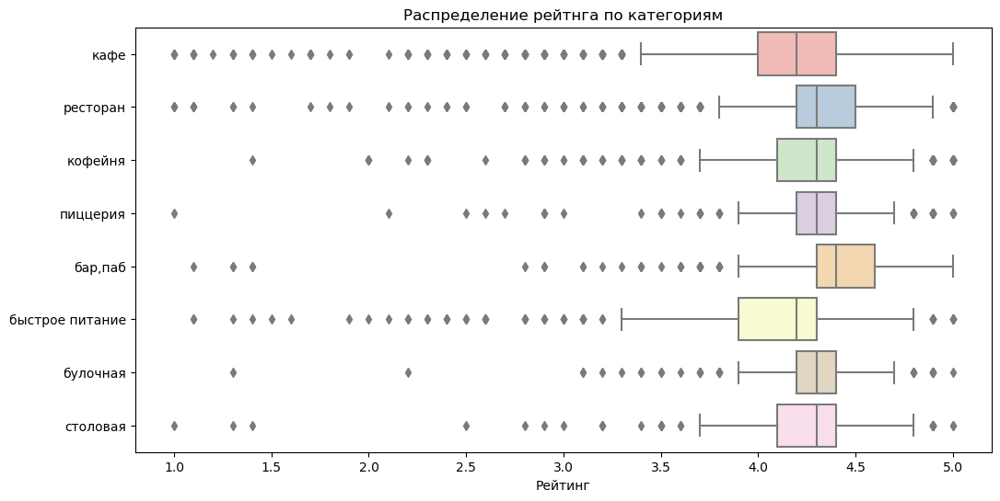

In [30]:
rating_top = df.groupby('category').agg({'rating': 'mean'}).sort_values(by='rating', ascending=False)

fig = go.Figure()
fig.add_trace(go.Bar(x = rating_top.index, 
                     y = rating_top['rating'].round(2), 
                     text = rating_top['rating'].round(2),
                     textposition='auto'))
fig.update_yaxes(range=[1, 5])
fig.update_layout(title='Распределение среднего рейтинга по категориями заведений',
                  xaxis_title='Категория заведений',
                  yaxis_title='Средний рейтинг',
                  height=600,
                  width=800)
fig.show() 

plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='rating', y='category', data=df, palette='Pastel1')
ax.set_title('Распределение рейтнга по категориям')
ax.set_xlabel('Рейтинг') 
ax.set_ylabel('')
plt.show()

Усредненный рейтинг по категориям имеет разброс от 4.05 до 4.39. Самый высокий рейтинг у баров/пабов, самый низкий в заведениях быстрого питания. Пиццерии, рестораны, кофейни и булочные имеют очень близкий по значениям рейтинг 4.27 - 4.3

#### Построение фоновой картограммы (хороплета) со средним рейтингом заведений каждого района

В датасете представлено 9 округов.
Для каждого округа посчитаю средний рейтинг заведений, которые находятся на его территории:

In [31]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [32]:
geo_json = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

#with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
#    geo_json = json.load(f)

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    #nan_fill_color = 'Green',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

In [33]:
rating_df

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Средний рейтинг по районам находится в диапазоне от 4.1 до 4.38. Самый высокий рейтинг у заведений Центрального АО. На 2 и 3 месте Северный АО (4.24) и Северо-Западный АО (4.21). Самый низкий рейтинг у заведений Юго-Восточного АО

#### Отобразить все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [34]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['district']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Чем дальше от центра - тем меньше заведений. При этом на севере и северо-востоке больше заведений, чем на юге и юго-востоке

#### Топ-15 улиц по количеству заведений

In [35]:
name_s = df.groupby('street').agg({'name': 'count'}).sort_values('name', ascending=False)[:15].index.tolist()

#top_street = df.query('street in @name_s').groupby(['street', 'category']).agg({'name': 'count'})

#total_street = []
#for name_street in top_street.index.get_level_values(0):
#    total_street.append(top_15_street.query('street == @name_street')['name'].sum())
#top_street['total_on_street'] = total_street

#top_street = top_street.sort_values(['total_on_street', 'name'],  ascending=False) \           
#              .rename(columns={'name': 'category_in_street'}).sort_index(ascending=[0])
#top_street

In [36]:
street_df = df.query('street in @name_s') \
              .pivot_table(index=['street', 'category'], values=['name'], aggfunc=['count']) \
              .reset_index()
street_df.columns=['street', 'category', 'cnt_shop']

fig = go.Figure()
fig = px.bar(street_df.sort_values('cnt_shop', ascending=True), 
             x='cnt_shop', 
             y='street', 
             text='cnt_shop', 
             color='category', 
             barmode='stack', 
             orientation = 'h',
             width=1000, height=600)

fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.update_layout(title='Распределение заведений по категориям на ТОП-15 улицах',
                  xaxis_title='Количество заведений',
                  yaxis_title='Название улицы')
fig.update_layout(legend=dict(yanchor="top",
                              y=.35,
                              xanchor="right",
                              x=.99))

fig.update_traces(textfont_size=11, textangle=0, textposition='inside')
fig.show()

street_df.merge(df[['district', 'street']], on='street', how='left')[['district', 'street']] \
         .drop_duplicates(keep='first').sort_values('street').T

,0,532,535,1236,1775,2199,2959,3519,3522,3531,...,4805,5185,6161,6497,6501,7273,7375,8740,8737,9122
district,Южный административный округ,Северный административный округ,Северо-Восточный административный округ,Южный административный округ,Западный административный округ,Северный административный округ,Северный административный округ,Центральный административный округ,Юго-Западный административный округ,Южный административный округ,...,Восточный административный округ,Юго-Западный административный округ,Центральный административный округ,Западный административный округ,Юго-Западный административный округ,Северо-Восточный административный округ,Центральный административный округ,Южный административный округ,Юго-Западный административный округ,Юго-Западный административный округ
street,Варшавское шоссе,Дмитровское шоссе,Дмитровское шоссе,Каширское шоссе,Кутузовский проспект,Ленинградский проспект,Ленинградское шоссе,Ленинский проспект,Ленинский проспект,Ленинский проспект,...,МКАД,Профсоюзная улица,Пятницкая улица,проспект Вернадского,проспект Вернадского,проспект Мира,проспект Мира,улица Вавилова,улица Вавилова,улица Миклухо-Маклая


Лидером по количеству заведений является проспект Мира (протяженностью почти 9 км, пролегающий от центра города). Меньше всего заведений находится на Пятницкой улице и улице Миклухо-Маклая. Ленингрдский проспект выделяется среди всех по количеству баров и пабов, на МКАДе много кафе.

#### Поиск улиц, на которых находится только один объект общепита

In [37]:
one_on_street = (df.groupby('street')
                   .agg({'address': 'count', 'category': pd.Series.mode})
                   .reset_index()
                   .sort_values(by='street', ascending=True)
                   .query('address == 1')
)

print(f'Количество улиц с одним заведением: {one_on_street.shape[0]}')

Количество улиц с одним заведением: 458


In [38]:
one = one_on_street["street"].tolist()
one_cat = df.query('street in @one').groupby('category') \
                                    .agg({'category': 'count'}) \
                                    .rename(columns={'category' : 'total_cat'}) \
                                    .sort_values(by='total_cat', ascending=False) \
                                    .reset_index()
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['district']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('street in @one').apply(create_clusters, axis=1)

# выводим карту
display(m)


fig = go.Figure()
fig = px.bar(one_cat, 
             x='category', 
             y='total_cat', 
             text='total_cat', 
             color='category')

fig.update_layout(title_text='Распределение точек по категориям на улицах с одним заведением',
                  xaxis_title='Категория заведений',
                  yaxis_title='Количество заведений',
                  showlegend=False)
fig.show()

#fig = go.Figure(data=[go.Pie(labels=one_cat.category, 
#                             values=one_cat.total_cat,
#                             pull = [0.1, 0])])
#fig.update_layout(title_text='Распределение заведений по категориям',
#                  width=700, 
#                  height=600,
#                  annotations=[dict(x=1.25, 
#                                    y=1.05,
#                                    text='Категории заведений',
#                                    showarrow=False)])
#fig.show()

Большая часть улиц с 1 одним заведением расположена в центре Москвы. Меньше всего таких улиц на юге и востоке Москвы. Количество улиц с одним заведением - 458. На 160 улицах расположены кафе и всего лишь на 8 - булочные. Так же на 93 улицах расположены - рестораны и на 84 улицах - кафе

#### Анализ среднего чека по районам

In [39]:
biil_df = df.groupby('district') \
            .agg({'middle_avg_bill': 'median'}) \
            .sort_values(by='middle_avg_bill', ascending=False) \
            .reset_index()

biil_df = biil_df.merge(df[['district', 'distr']], on='district', how='left').drop_duplicates(keep='first')

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=geo_json,
    data=biil_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    #nan_fill_color = 'Green',
    fill_opacity=0.8,
    legend_name='- по районам',
).add_to(m)

display(m)

fig = go.Figure()
fig = px.bar(biil_df, 
             x='middle_avg_bill', 
             y='distr', 
             text='middle_avg_bill', 
             color='distr',
             orientation = 'h')

fig.update_layout(title_text='Анализ медианы среднего чека по районам',
                  xaxis_title='Средний чек',
                  yaxis_title='',
                  showlegend=False,
                  width=1065, 
                  height=500,)
fig.update_xaxes(tickangle=0)
fig.show()

Медиана среднего чека самая высокая в Западном и Центральном АО и равна 1 000. Самая низкая медиана среднего чека в Юго-Восточном АО. Чем дальше от центра, тем ниже средний чек, за исключением Западного АО.

#### Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

Визуализирую распредение заведений по категориям в зависимости от часов работы: круглосуточные/не круглосуточные.
Так же выведу таблицу с количеством круглосуточных и не круглосуточных заведений по районам

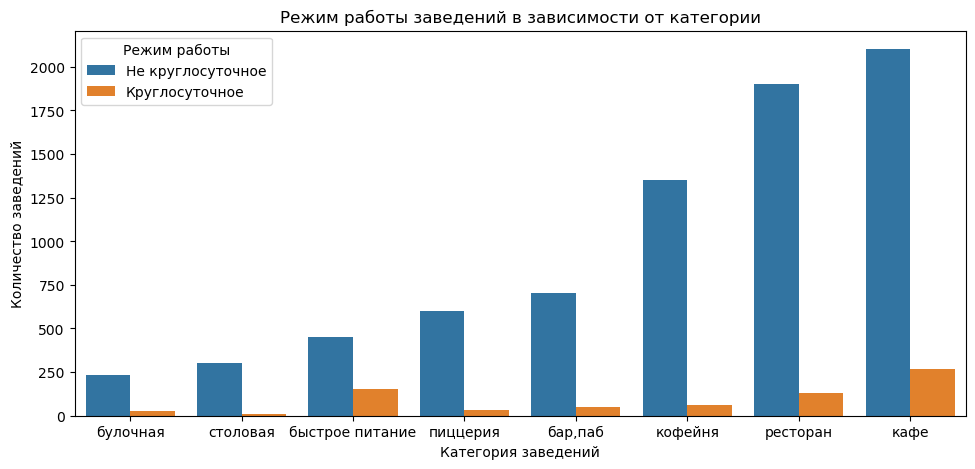

,is_24/7,not_24/7,%_24/7
district,,,
Центральный административный округ,131,2111,5.84
Восточный административный округ,97,694,12.26
Юго-Восточный административный округ,93,621,13.03
Северо-Восточный административный округ,75,815,8.43
Южный административный округ,75,816,8.42
Юго-Западный административный округ,73,634,10.33
Западный административный округ,70,760,8.43
Северный административный округ,70,828,7.80
Северо-Западный административный округ,43,366,10.51


In [40]:
d = df.groupby(['category', 'is_24/7']).agg({'name': 'count'}).reset_index() \
      .sort_values(by=['is_24/7', 'name'])

labels=['Не круглосуточное', 'Круглосуточное']
plt.figure(figsize=(11.5, 5))
ax = sns.barplot(x='category', y='name', data=d, hue='is_24/7')
h, l = ax.get_legend_handles_labels()
ax.legend(h, labels, title='Режим работы')
plt.title('Режим работы заведений в зависимости от категории')
plt.xlabel('Категория заведений')
plt.ylabel('Количество заведений')
plt.show()

hours_df = df.groupby('district').agg({'is_24/7': 'sum'}).astype(int)
hours_df['not_24/7'] = (df.groupby('district').agg({'is_24/7': 'count'})['is_24/7'] - hours_df['is_24/7']).astype(int)
hours_df['%_24/7'] = (hours_df['is_24/7'] / df.groupby('district').agg({'is_24/7': 'count'})['is_24/7']) * 100
hours_df.sort_values('is_24/7', ascending=False)

Круглосуточных заведений намнго меньше, чем не круглосуточных. Меньше всего круглосуточных столовых и булочных, больше всего кафе и заведений быстрого питания. Большая доля круглосуточных заведений приходится на точки быстрого питания. По районам круглосуточные заведения распределены неравномерно. Больше всего круглосуточных заведений в Центральном, Восточном и Юго-Восточном АО. Меньше всего в Северо-Западном АО. Самая большая доля круглосуточных заведений в Юго-Восточном и Восточном АО.

Теперь рассмотрю заведения с плохим рейтингом, за низкий рейтинг возьму значения, которые входят в 5 перцентилей. Построю визуализацию распределения среднего чека по категориям заведений с низким рейтингом

In [41]:
bad_r = np.nanpercentile(df['rating'], 5)
bad_rate = df.query('rating <= @bad_r') \
             .groupby('category').agg({'name': 'count', 'middle_avg_bill': 'mean', 'rating': 'mean'}) \
             .reset_index().sort_values('rating', ascending=False)

fig = go.Figure()
fig = px.bar(bad_rate.sort_values('middle_avg_bill').round(), 
             x='category', 
             y='middle_avg_bill', 
             text='middle_avg_bill')

fig.update_layout(title_text='Распределение среднего чека по категориям заведений с низким рейтингом',
                  xaxis_title='Категория заведений',
                  yaxis_title='Средний чек',
                  showlegend=False)
fig.show()

bad_rate

,category,name,middle_avg_bill,rating
4,кофейня,45,466.67,2.95
1,булочная,8,612.50,2.88
2,быстрое питание,65,324.41,2.78
3,кафе,213,831.09,2.74
6,ресторан,66,"1,258.33",2.68
5,пиццерия,10,837.00,2.60
7,столовая,11,356.25,2.54
0,"бар,паб",15,150.00,2.53


Самый высокий средний чек в ресторане при средним рейтинге 2.68 - 1 258, самый низкий средний чек у баров и пабов при среднем рейтинге 2.53 - 150.

ТОП заведений с рейтингом 1 

In [42]:
df.query('rating == 1').groupby('name').agg({'category': pd.Series.mode})

,category
name,
PHO STREET,кафе
ДОБРО ПОЖАЛОВАТЬ,ресторан
НА МАНГАЛЕ,кафе
ОМОРЕМОРЕ,ресторан
ПОЛЯНКА,кафе
СЕТУНЬ,ресторан
СТАР,кафе
ТЕСТО И СЫР,пиццерия
УЛЕЙ,столовая


В заведения с рейтингом 1 попали кафе, рестораны, пиццерия и столовая

**Вывод:**

- В данных представлено 8 категорий заведений: кафе, ресторан, кофейня, пиццерия, бар,паб, быстрое питание, булочная, столовая, где кафе и рестораны наиболее распространены. 
- Больше всего посадочных мест в ресторанах (86). Меньше всего в булочных(50).
- Несетевых заведений больше, их доля составляет 61.9% (5 181 заведение) от общего числа заведений.
- Большая доля сетевых заведений приходится на булочные, но таких заведений меньше всего по общему количеству. На пиццерии и кофейни приходится по 50% сетевых заведений. Кафе и ресторанов больше всего по общему количеству, доля сетевых заведений у них составляет ~34%.
- В датасете есть данные по 9 административным округам Москвы.
- Кофейня Шоколадница является самой популярной сетью, а Центральный административный округ Москвы имеет наибольшее количество заведений. 
- Средний рейтинг заведений варьируется от 4.05 до 4.39. Самый высокий рейтинг у баров/пабов, самый низкий в заведениях быстрого питания
- Медиана среднего чека выше в Центральном и Западном административных округах. Самая низкая медиана среднего чека в Юго-Восточном АО.
- Лидером по количеству заведений является проспект Мира. Меньше всего заведений находится на Пятницкой улице и улице Миклухо-Маклая. 
- Большая часть улиц с 1 одним заведением расположена в центре Москвы. Меньше всего таких улиц на юге и востоке Москвы. Количество улиц с одним заведением - 458. На 160 улицах расположены кафе и всего лишь на 8 - булочные.


### Детализируем исследование: открытие кофейни

#### Анализ кофеен и их расположения

In [43]:
df.query('category == "кофейня"')['name'].count()

1408

In [44]:
distr_df = df.query('category == "кофейня"') \
             .groupby('district') \
             .agg({'name': 'count'}) \
             .sort_values(by='name', ascending=False) \
             .reset_index()

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['district']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('category == "кофейня"').apply(create_clusters, axis=1)

# выводим карту
display(m)

fig = go.Figure()
fig = px.bar(distr_df, 
             x='name', 
             y='district', 
             text='name', 
             color='district',
             orientation = 'h')

fig.update_layout(title_text='Распределение кофеен по округам',
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  showlegend=False)
fig.show()

Всего в датасете представлено 1 408 кофеен. Больше всего кофеен расположено в Центральном АО - 428. Меньше всего в Северо-Западном АО. При этом на юге и востоке Москвы кофеен меньше чем на севере и западе.

#### Анализ круглосуточных кофеен

In [45]:
day_night = df.query('category == "кофейня" & hours == "ежедневно, круглосуточно"') \
              .groupby('district') \
              .agg({'name': 'count'}) \
              .sort_values(by='name', ascending=False) \
              .reset_index()

fig = go.Figure()
fig = px.bar(day_night, 
             x='name', 
             y='district', 
             text='name', 
             color='district',
             orientation = 'h')

fig.update_layout(title_text='Распределение круглосуточных кофеен по округам',
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  showlegend=False)
fig.show()

Больше всего круглосуточных кофеен в Центральном АО - 26. На 2 месте Западный АО - 9 кофеен. Меньше всего круглосуточных кофеен в Юго-Восточном и Южном АО.

#### Анализ рейтинга кофеен по районам

In [46]:
rating_coffee = df.query('category == "кофейня"')\
                  .groupby('district') \
                  .agg({'rating': 'mean'}) \
                  .sort_values(by='rating', ascending=False)\
                  .reset_index()
rating_coffee['rating'] = rating_coffee['rating'].round(2)

fig = go.Figure()
fig = px.bar(rating_coffee, 
             x='rating', 
             y='district', 
             text='rating', 
             color='district',
             orientation = 'h')

fig.update_layout(title_text='Распределение рейтинга кофеен по районам',
                  xaxis_title='Рейтинг заведений',
                  yaxis_title='',
                  showlegend=False,
                  xaxis_range=[1,5])

fig.show()

Рейтинг кофеен по районам расположен в диапазоне от 4.19 до 4.34. Самый высокий рейтинг у кофеен в Центральном и Северо-Западном АО, самый низкий в Западном АО

#### Анализ стоимости чашки капучино

In [47]:
cup_coffee = df.query('category == "кофейня"') \
               .groupby('district') \
               .agg({'middle_coffee_cup': 'mean'}) \
               .sort_values(by='middle_coffee_cup', ascending=False) \
               .reset_index()
cup_coffee['middle_coffee_cup'] = cup_coffee['middle_coffee_cup'].astype(int)

fig = go.Figure()
fig = px.bar(cup_coffee, 
             x='middle_coffee_cup', 
             y='district', 
             text='middle_coffee_cup', 
             color='district',
             orientation = 'h')

fig.update_layout(title_text='Распределение средней цены чашки капучино по районам',
                  xaxis_title='Средняя цена чашки капучино',
                  yaxis_title='',
                  showlegend=False)

fig.show()

Самая высокая средняя цена чашки капучино в Западном (188), Центральном (187) и Юго-Западном (184) АО. Самая низкая в Юго-Восточном (151)

**Вывод:**

**Рекомендации по открытию кофейни:**

- для открытия кофейни необходимо учитывать пешеходный траффик - так как Москва - город с высоким уровнем населением, столица и туристический центр, при выборе места для кофейни нужно учитывать улицы с высоким пешеходным траффиком например: ул. Маросейка, пр. Мира, ул. Бауманская. Чаще всего такие улицы проходят через центра города, поэтому стоит обратить внимание на Центральный АО. Наличие большого количества конкурентов в этом районе не должно пугать, оно может свидетельствовать о большом спросе в данном районе
- для выбора места необходимо ориентироваться на остановки автобусов, выходы из метро, наличие торговых или бизнес центров рядом, парков, пролегающих через потенциальное место кофейни туристических маршрутов, так как такие места являются узловыми точками
- круглосуточной кофейню делать не стоит, поток людей ночью в разы меньше, чем днем, о чем свидетельствует небольшое количество круглосуточных кофеен в Москве
- цену одной чашки капучино не стоит делать ниже 200 рублей. Такая цена складывается из цены за аренду в центре Москвы и других платежей, а так же необходимо успевать обслуживать высокий поток посетителей. Такой ценой мы отсечем длинный хвост очереди и недовольных гостей. Тем самым рейтинг не будет падать из-за негативных отзывов по ожиданию и выручка будет на необходимом уровне

### Вывод

**Общий вывод из анализа:**

- В данных представлено 8 категорий заведений: кафе, ресторан, кофейня, пиццерия, бар/паб, быстрое питание, булочная, столовая, где кафе и рестораны наиболее распространены. 
- Больше всего посадочных мест в ресторанах - 86. Меньше всего в булочных - 50.
- Несетевых заведений больше, их доля составляет 61.9% (5 181 заведение) от общего числа заведений.
- Большая доля сетевых заведений приходится на булочные, но таких заведений меньше всего по общему количеству. На пиццерии и кофейни приходится по 50% сетевых заведений. Кафе и ресторанов больше всего по общему количеству, доля сетевых заведений у них составляет ~34%.
- В датасете есть данные по 9 административным округам Москвы.
- Кофейня Шоколадница - самая популярная сеть, а Центральный административный округ Москвы имеет наибольшее количество заведений. 
- Бары/пабы имеют самый высокий рейтинг, быстрое питание - самый низкий.
- Медиана среднего чека выше в Центральном и Западном АО, а ниже в Юго-Восточном АО.
- Проспект Мира - лидер по количеству заведений, Пятницкая улица и улица Миклухо-Маклая - имеет наименьшее количество заведений.
- Большинство улиц с одним заведением находятся в центре Москвы, наименьшее количество таких улиц на юге и востоке Москвы. Всего 458 улиц с одним заведением, из них 160 - кафе, 8 - булочные.


**Рекомендации по открытию кофейни:**

- при выборе места для кофейни нужно учитывать улицы с высоким пешеходным траффиком например: ул. Маросейка, пр. Мира, ул. Бауманская. Чаще всего такие улицы проходят через центра города, поэтому стоит обратить внимание на Центральный АО. 
- для выбора места необходимо ориентироваться на остановки автобусов, выходы из метро, наличие торговых или бизнес центров рядом, парков, пролегающих через потенциальное место кофейни туристических маршрутов, так как такие места являются узловыми точками
- круглосуточной кофейню делать не стоит
- цену одной чашки капучино не стоит делать ниже 200 рублей. Такая цена складывается из цены за аренду в центре Москвы и других платежей, а так же необходимо обеспечить высокое качество обслуживания. Такой ценой мы отсечем длинный хвост очереди и недовольных из-за этого гостей. Тем самым рейтинг не будет падать из-за негативных отзывов по ожиданию и выручка будет на необходимом уровне

Презентация: <https://drive.google.com/file/d/1mGTOsYKoZ-qwP79AlLu21wTjEXJPlEh_/view?usp=sharing> 